In [34]:
import pinecone

pinecone.init(api_key="YOUR_API_KEY", environment="us-west4-gcp-free")

In [35]:
captions = []
with open("4000.txt") as file:
    while line := file.readline():
        t = line.split("~")
        captions.append((t[0].strip(), t[1].strip()))

with open("6000.txt") as file:
    while line := file.readline():
        t = line.split("~")
        captions.append((t[0].strip(), t[1].strip()))

print(len(captions))

5999


In [36]:
captions[0]

('street signs on a street near a wooded area',
 '/content/drive/MyDrive/wsl/CAM_FRONT/n010-2018-07-10-10-37-43+0800__CAM_FRONT__1531190655262488.jpg')

In [37]:
from sentence_transformers import SentenceTransformer
# model = SentenceTransformer('bert-base-nli-mean-tokens')
model = SentenceTransformer('all-MiniLM-L6-v2')

In [38]:
sentences = [t[0] for t in captions]

In [39]:
print(len(sentences))
sentences[0]

5999


'street signs on a street near a wooded area'

In [40]:
embeddings = model.encode(sentences)

In [41]:
embeddings[0].shape

(384,)

In [42]:
# Index to perform ANN search, using euclidean distance metric.
pinecone.create_index(name="my-index", dimension=384, metric="euclidean", index_type="approximated")   # This index_type is also the default.

- Time to create 384-d index is 10:58 minutes, but varies highly (1:18 minutes)

In [43]:
pinecone.list_indexes()

['my-index']

In [51]:
# Connect to the index.
index = pinecone.Index(index_name="my-index")

In [52]:
upsert_data = [(str(i), [float(e) for e in embeddings[i]]) for i in range(0, len(embeddings))]

In [53]:
type(upsert_data[0][1][0])

float

In [54]:
upsert_data[1]

('1',
 [0.025105083361268044,
  0.008600153960287571,
  -0.01604551263153553,
  0.02929312363266945,
  -0.056350164115428925,
  0.053240854293107986,
  0.10226805508136749,
  -0.025790927931666374,
  -0.00905761867761612,
  -0.048253133893013,
  0.0760611742734909,
  0.018212364986538887,
  -0.0008642106549814343,
  -0.0332520417869091,
  -0.025801358744502068,
  0.009798824787139893,
  -0.028492029756307602,
  -0.028833666816353798,
  0.015958016738295555,
  -0.016993407160043716,
  -0.0673450455069542,
  -0.054379213601350784,
  -0.00681384839117527,
  -0.0010836654109880328,
  -0.127847358584404,
  0.04020468890666962,
  0.06088443845510483,
  0.031124381348490715,
  0.07865980267524719,
  -0.016685694456100464,
  0.0526244193315506,
  -0.032917749136686325,
  0.0272067841142416,
  0.030752697959542274,
  -0.12842655181884766,
  -0.033871572464704514,
  0.050261761993169785,
  0.029599636793136597,
  0.05486026406288147,
  0.04241082817316055,
  -0.0010683879954740405,
  -0.08479961

In [55]:
# Insert data.
# Upsert: insert a new vector, or update if same Id exists.
for i in range(0, 59):
    index.upsert(upsert_data[i*100:(i + 1)*100])

- Upsert 100 * 40 embeddings in 1:13 minutes.
- Upsert 100 * 59 embeddings in 31 seconds, 27 seconds

When upserting larger amounts of data, upsert data in batches of 100 vectors or fewer over multiple upsert requests.

In [56]:
index.describe_index_stats()

{'dimension': 384,
 'index_fullness': 0.0,
 'namespaces': {'': {'vector_count': 5900}},
 'total_vector_count': 5900}

In [57]:
query_vectors = []
query_vector = [float(e) for e in model.encode(["a street with a car in the corner and a street light"])[0]]
query_vectors.append(query_vector)
query_vector = [float(e) for e in model.encode(["a street with a tree in the corner and a street light"])[0]]
query_vectors.append(query_vector)
query_vector = [float(e) for e in model.encode(["a street with trees on both sides of the street"])[0]]
query_vectors.append(query_vector)
query_vector = [float(e) for e in model.encode(["an empty street with buildings on the side"])[0]]
query_vectors.append(query_vector)

In [59]:
# query_vector

In [63]:
import time
results = []
for q in query_vectors:
    st = time.time()
    # Query the DB.
    res = index.query(
    vector=q,
    top_k=5,
    include_values=True
    )
    end = time.time()
    print(end - st)
    results.append(res)

0.4968910217285156
0.25363850593566895
0.25475001335144043
0.25154614448547363


### Seconds query time for k = 5
- 0.5085093975067139
- 1.7753829956054688
- 0.2710866928100586
- 0.2524909973144531

### While upserting 5000 data points
- 0.4968910217285156
- 0.25363850593566895
- 0.25475001335144043
- 0.25154614448547363
---
- 0.6426284313201904
- 0.25519776344299316
- 0.2558126449584961
- 0.2689933776855469
---
- 0.5010218620300293
- 0.2731502056121826
- 0.3054535388946533
- 0.3051319122314453

In [29]:
images = []

for e in res['matches']:
    images.append(captions[int(e['id'])][1].split("/")[-1])
    print(sentences[int(e['id'])])
    print(captions[int(e['id'])][1])
    print("")

a white van on street next to a traffic light
/content/drive/MyDrive/wsl/CAM_FRONT/n008-2018-05-15-14-32-56-0400__CAM_FRONT__1526409711012465.jpg

a street filled with cars and trucks
/content/drive/MyDrive/wsl/CAM_FRONT/n015-2018-07-11-16-05-09+0800__CAM_FRONT__1531296417412460.jpg

a street scene with a person riding a bicycle
/content/drive/MyDrive/wsl/CAM_FRONT/n015-2018-09-13-11-50-21+0800__CAM_FRONT__1536811146512460.jpg

traffic lights are shown in a street
/content/drive/MyDrive/wsl/CAM_FRONT/n015-2018-09-13-16-24-28+0800__CAM_FRONT__1536827197362460.jpg

people on a street with buildings
/content/drive/MyDrive/wsl/CAM_FRONT/n010-2018-07-03-11-06-43+0800__CAM_FRONT__1530588181112488.jpg



In [30]:
base = "../data/sets/nuimages/samples/CAM_FRONT/"
query_path = "n013-2018-09-17-13-23-26+0800__CAM_FRONT__1537162373162407.jpg"

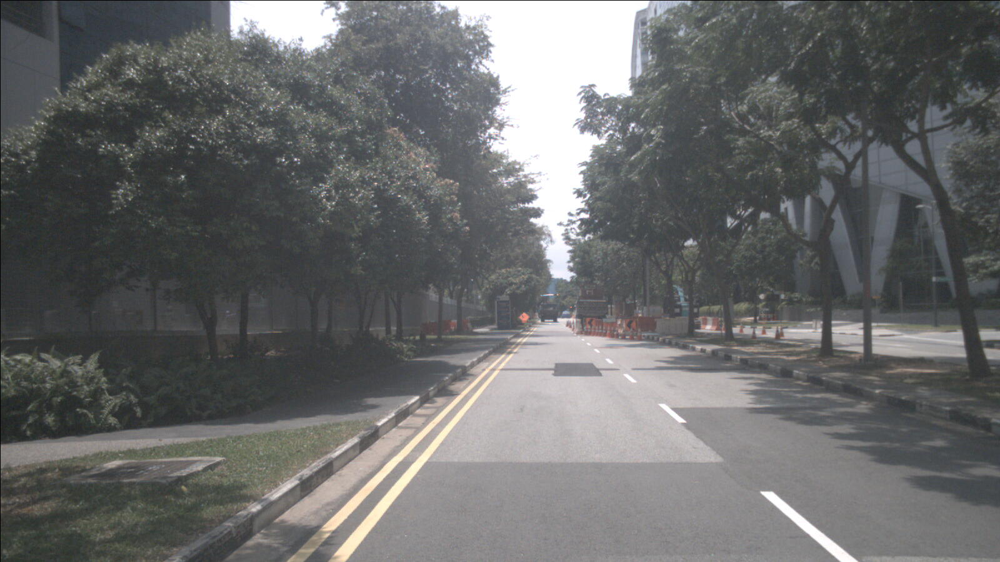

In [31]:
from IPython.display import display
from PIL import Image

display(Image.open(base + query_path))

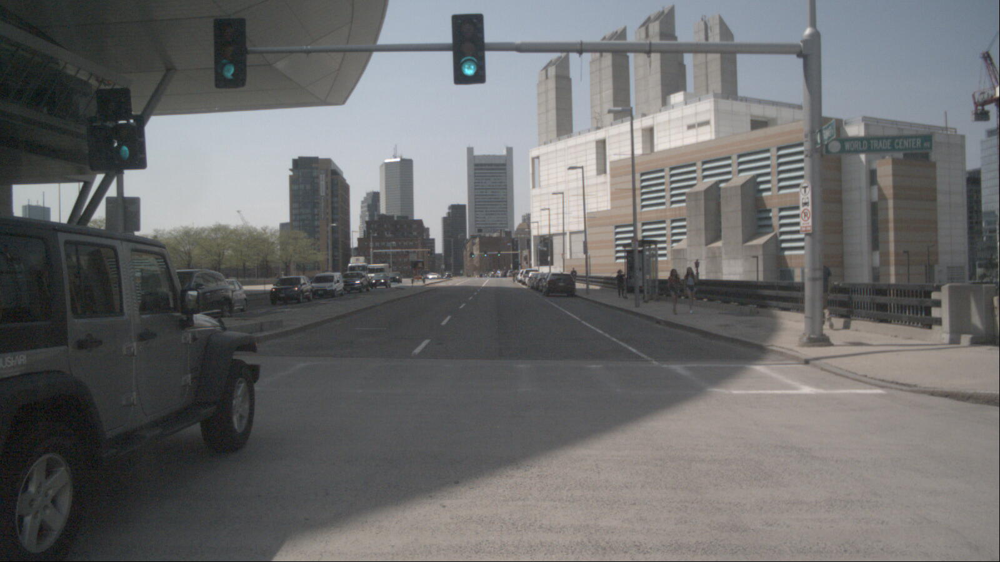

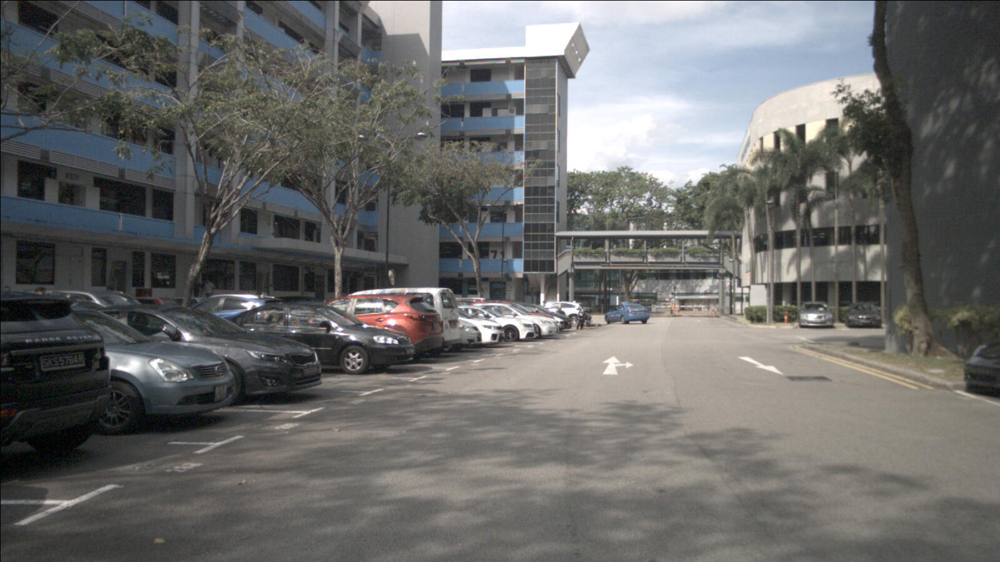

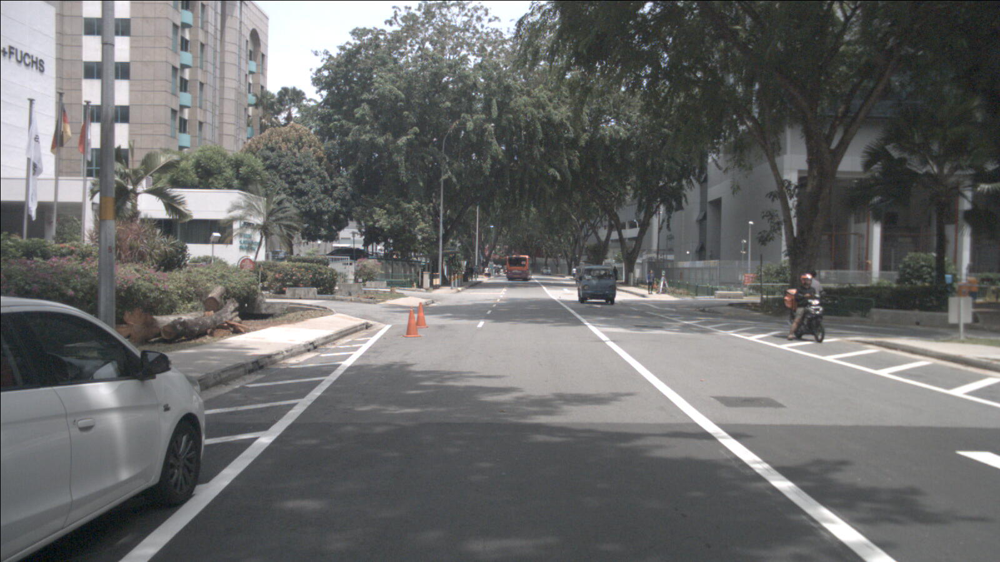

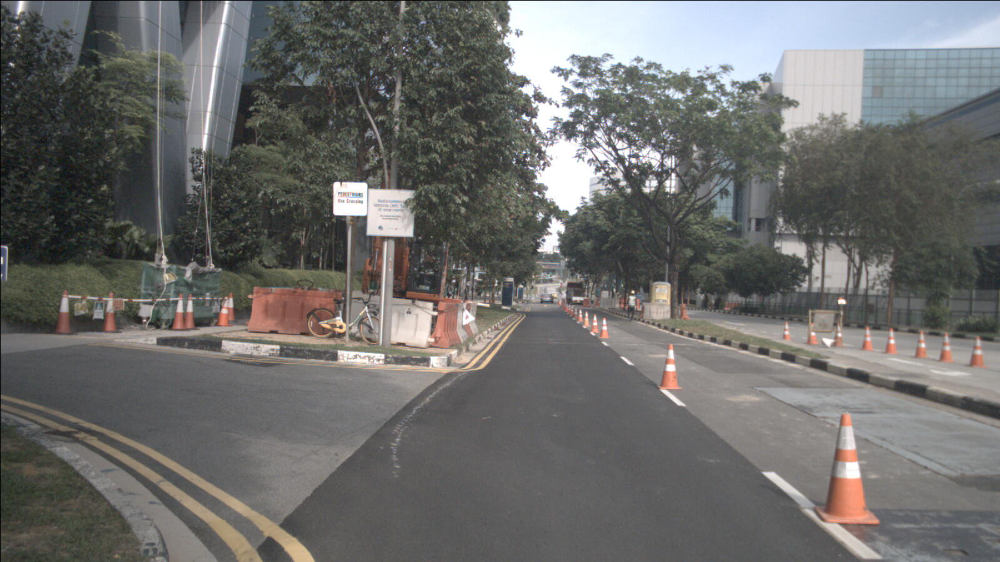

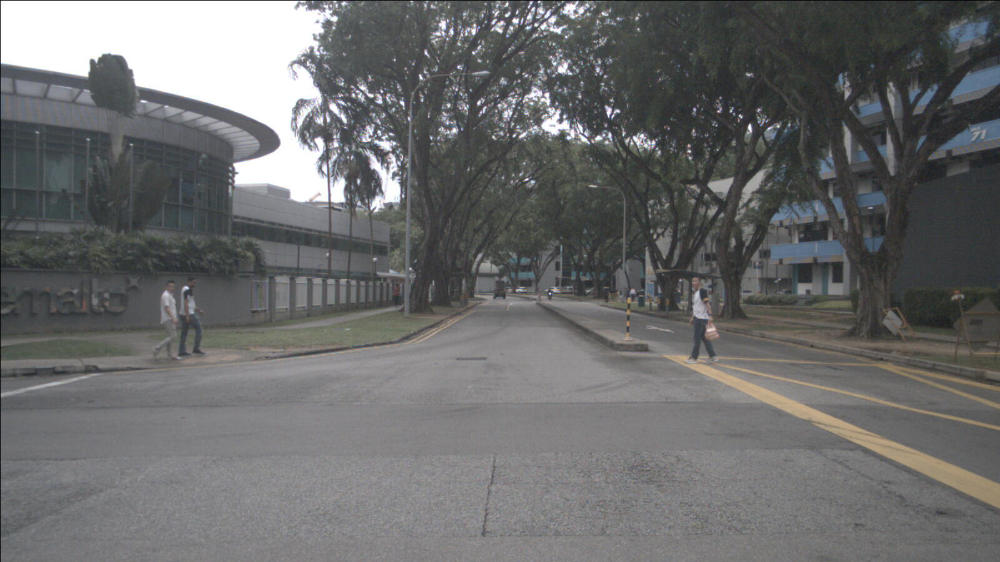

In [32]:
for _ in images:
    display(Image.open(base + _))

In [64]:
# Delete an index when no longer needed.
pinecone.delete_index("my-index")